# KMeans

## Import packages

In [1]:
from simpl_eeg import eeg_objects

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import altair as alt

import mne
from mne.preprocessing import (create_eog_epochs, create_ecg_epochs,
                               compute_proj_ecg, compute_proj_eog)
import scipy.io
import scipy.interpolate
from scipy import signal
from scipy.cluster.hierarchy import (
    average,
    complete,
    dendrogram,
    fcluster,
    single,
    ward,
)

from sklearn import cluster, datasets, metrics
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans
from sklearn.datasets import make_moons

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
import mglearn

from IPython.display import HTML

import warnings
warnings.filterwarnings('ignore')

In [2]:
# update figure size
plt.rcParams['figure.figsize'] = [18, 8]

# random state to make results reproducible
random_state = 42

## Selecting EEG data

We can select the data we want to use with the `simpl_eeg` package. We can either look at individual time steps or time steps averaged over time. We can also specify what time to look at.

For more information about making these selections, please see the page on [Creating EEG Objects](https://ubc-mds.github.io/simpl_eeg_capstone/eeg_objects.html) in the `simpl_eeg` documentation. 

Averaging the data has will reduce the dimensionality of the data, but which method you want to use will depend on what you are trying to achieve. 

In [3]:
# experiment we want to use data from
experiment_number = "../../data/927"

# set the start second if you want to use a custom time
# when the start second is None, the impact times from the experiment will be used. 
start_second = 500
# start_second = None

# the number of seconds before the event to use
tmin = -5

# the number of seconds after the event to use
tmax = 5

epochs = eeg_objects.Epochs(experiment_number, tmin=tmin, tmax=tmax, start_second=start_second)
epoch = epochs.epoch

# the lines below are to average every n steps
# number of steps to average
n = 5

averaged_epoch = epochs.average_n_steps(n)

print("\nDimensionality difference between raw and averaged:")
print(f"Raw: {epoch.get_data().shape}")
print(f"Averaged: {averaged_epoch.get_data().shape}")

Reading /Users/sasha/mds/simpl_eeg_capstone/data/927/fixica.fdt
Not setting metadata
Not setting metadata
1 matching events found
Setting baseline interval to [-5.0, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 1 events and 20481 original time points ...
0 bad epochs dropped

Dimensionality difference between raw and averaged:
Raw: (1, 19, 20481)
Averaged: (19, 4097)


In [4]:
# Choose which data you want by commenting or uncommenting the lines below:

# selected_var = epoch
selected_var = averaged_epoch

# Convert the data into a dataframe for easy analysis with clustering methods
df = selected_var.to_data_frame()

In [5]:
df

,time,Fp1,Fp2,F7,T3,T5,F3,C3,P3,Fz,Cz,Pz,F4,C4,P4,F8,T4,T6,O1,O2
0,-5000,-2.142964,-2.082300,-3.921260,-3.165924,-4.170972,-4.046892,-2.524584,-4.064750,-1.732519,-6.700452,-6.999803,-2.115932,-13.050023,-15.039324,-3.247411,-9.333675,-15.476745,-7.021678,-6.873370
1,-4998,0.348089,0.423529,4.300959,0.920400,0.541863,0.686489,-1.257067,-0.978996,1.075349,-2.030495,-2.374837,2.907500,-5.932206,-4.618938,-0.637227,-2.743770,-0.703730,-2.287310,5.844364
2,-4995,1.532450,1.166931,-2.631870,-0.440986,-1.537779,2.203862,-0.754222,-1.137374,2.360636,-0.470801,0.208197,2.140159,-2.718701,0.046264,-0.801451,-0.217120,7.626586,-0.785246,13.597781
3,-4993,-0.934557,-0.657457,-4.503684,0.794133,3.436055,5.616216,-0.203967,-2.538711,2.296078,-1.756618,-6.182927,0.426988,-6.576368,-8.277088,-0.425292,-1.979247,-6.138194,-3.041988,-11.702017
4,-4990,-2.681972,-1.817882,-3.408424,-0.625318,0.136718,2.042510,-3.622323,-7.035989,-0.749793,-5.304903,-9.796501,-4.111596,-8.562948,-11.580355,1.077663,-3.429904,-7.037368,0.078492,-4.147627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4092,4990,-3.375544,-1.783260,1.995727,0.042401,-1.361240,-1.048239,-6.164329,-10.004316,-1.603918,-7.292943,-11.460950,6.017967,-6.909478,-12.254822,-3.284785,-4.753442,-14.887448,1.146637,-19.824144
4093,4993,-0.332220,1.638588,6.136731,2.624493,-3.471768,6.746126,-2.255788,-6.396877,2.044851,-1.761805,-3.752483,9.424398,3.134692,0.217026,1.870303,2.695597,3.358110,2.738733,4.546917
4094,4995,5.123798,6.562507,8.321201,4.264636,0.305584,9.144548,2.953328,-0.080505,7.820598,4.618179,5.138324,12.357580,10.792522,8.736369,4.913514,6.765996,14.954993,11.644752,23.719645
4095,4998,0.869771,1.777732,6.222602,-1.153864,-5.440150,-5.374188,-4.053940,-6.137930,-0.036913,0.012414,-3.664151,4.670846,5.128828,0.075488,0.694852,2.319476,4.046730,1.306231,11.224397


In [6]:
# Drop the time column and convert to array
df.drop(columns = ["time"], inplace=True)
X = df.to_numpy()

In [7]:
X

array([[ -2.1429643 ,  -2.08229954,  -3.92126043, ..., -15.47674471,
         -7.02167822,  -6.87336996],
       [  0.3480895 ,   0.42352919,   4.30095924, ...,  -0.70372972,
         -2.28730962,   5.84436428],
       [  1.53245019,   1.16693078,  -2.63187045, ...,   7.62658606,
         -0.7852463 ,  13.59778149],
       ...,
       [  5.12379826,   6.56250707,   8.32120089, ...,  14.95499306,
         11.64475229,  23.71964524],
       [  0.86977086,   1.77773204,   6.22260241, ...,   4.04673047,
          1.30623081,  11.22439692],
       [  2.28317851,   3.43003278,  11.48224275, ...,   3.72959679,
          5.42896079,  -2.81924703]])

## K-Means Clustering

 

**Clustering** is the task of partitioning the dataset into groups called clusters.

The goal of clustering is to discover underlying groups in a given dataset such that:
- examples in the same group are as similar as possible;
- examples in different groups are as different as possible.          

#### K-Means using `sklearn`

**Input**
- `X` $\rightarrow$ a set of data points  
- `K` (or $k$ or `n_clusters`) $\rightarrow$ number of clusters

**Output**
- `K` clusters (groups) of the data points (Represent each cluster by its cluster center and assign a cluster membership to each data point)

The number of clusters can be selected based on the methods for assessing goodness of fit in the [Quality Assessment](#Quality-Assessment) section below. 

In [8]:
# Set parameters
n_clusters = 4

In [9]:
# fit the data
kmeans_model = KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans_model.fit(X)

KMeans(n_clusters=4, random_state=42)

In [10]:
# predict the clusters
predictions = kmeans_model.predict(X)
predictions

array([1, 3, 0, ..., 2, 0, 3], dtype=int32)

In [11]:
# view cluster centers
kmeans_model.cluster_centers_

array([[-1.06770153e+00, -1.53377193e+00, -2.13726410e+00,
        -5.68042189e-01,  1.58456290e+00, -3.39539562e+00,
        -1.56852952e+00,  5.53182386e-01, -3.58897036e+00,
        -1.01701707e+00,  1.74954007e+00, -2.28490504e+00,
         1.69084961e-01,  3.06611099e+00, -1.51646260e+00,
         3.17005438e-02,  4.73242239e+00,  4.01129579e+00,
         7.67115195e+00],
       [-6.73008402e+00, -6.16105879e+00, -3.42912322e+00,
        -3.40519252e+00, -5.07637539e+00, -8.25301749e+00,
        -8.63217108e+00, -8.25212315e+00, -9.62364633e+00,
        -1.02724086e+01, -9.70341551e+00, -7.62015441e+00,
        -8.49721537e+00, -8.72985122e+00, -3.30566610e+00,
        -4.25641952e+00, -6.93347800e+00, -6.61288733e+00,
        -8.67785328e+00],
       [ 7.71159102e+00,  7.20478386e+00,  4.54758881e+00,
         3.95745508e+00,  5.21572311e+00,  9.63520492e+00,
         9.85909520e+00,  8.69317916e+00,  1.10923009e+01,
         1.14824662e+01,  1.09174067e+01,  9.38457164e+00,
    

In [12]:
# Create new data frame with the predicted cluster assignment
df_predict = df.copy()
df_predict["Cluster"] = predictions
df_predict

,Fp1,Fp2,F7,T3,T5,F3,C3,P3,Fz,Cz,Pz,F4,C4,P4,F8,T4,T6,O1,O2,Cluster
0,-2.142964,-2.082300,-3.921260,-3.165924,-4.170972,-4.046892,-2.524584,-4.064750,-1.732519,-6.700452,-6.999803,-2.115932,-13.050023,-15.039324,-3.247411,-9.333675,-15.476745,-7.021678,-6.873370,1
1,0.348089,0.423529,4.300959,0.920400,0.541863,0.686489,-1.257067,-0.978996,1.075349,-2.030495,-2.374837,2.907500,-5.932206,-4.618938,-0.637227,-2.743770,-0.703730,-2.287310,5.844364,3
2,1.532450,1.166931,-2.631870,-0.440986,-1.537779,2.203862,-0.754222,-1.137374,2.360636,-0.470801,0.208197,2.140159,-2.718701,0.046264,-0.801451,-0.217120,7.626586,-0.785246,13.597781,0
3,-0.934557,-0.657457,-4.503684,0.794133,3.436055,5.616216,-0.203967,-2.538711,2.296078,-1.756618,-6.182927,0.426988,-6.576368,-8.277088,-0.425292,-1.979247,-6.138194,-3.041988,-11.702017,3
4,-2.681972,-1.817882,-3.408424,-0.625318,0.136718,2.042510,-3.622323,-7.035989,-0.749793,-5.304903,-9.796501,-4.111596,-8.562948,-11.580355,1.077663,-3.429904,-7.037368,0.078492,-4.147627,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4092,-3.375544,-1.783260,1.995727,0.042401,-1.361240,-1.048239,-6.164329,-10.004316,-1.603918,-7.292943,-11.460950,6.017967,-6.909478,-12.254822,-3.284785,-4.753442,-14.887448,1.146637,-19.824144,1
4093,-0.332220,1.638588,6.136731,2.624493,-3.471768,6.746126,-2.255788,-6.396877,2.044851,-1.761805,-3.752483,9.424398,3.134692,0.217026,1.870303,2.695597,3.358110,2.738733,4.546917,3
4094,5.123798,6.562507,8.321201,4.264636,0.305584,9.144548,2.953328,-0.080505,7.820598,4.618179,5.138324,12.357580,10.792522,8.736369,4.913514,6.765996,14.954993,11.644752,23.719645,2
4095,0.869771,1.777732,6.222602,-1.153864,-5.440150,-5.374188,-4.053940,-6.137930,-0.036913,0.012414,-3.664151,4.670846,5.128828,0.075488,0.694852,2.319476,4.046730,1.306231,11.224397,0


## Quality Assessment

We used several methods for estimating the best value of the number of clusters (`K`) for the K-means algorithm. A summary of the results of each method is detailed below, with instructions on how to perform them. 

1)**[The Elbow Method](#The-Elbow-Method)** - determine best value for `K`

2)**[The Silhouette Method](#The-Silhouette-Method)** - alternative method to determine best value for `K`

3)**[Principal Component Analysis (PCA)](#Principal-Component-Analysis-(PCA))** - visualize clusters in 2D space to see if they are reasonably separated


### The Elbow Method

With the elbow method, you can set a range of values for `K` and visualize the result of the algorithm. 

- This method looks at the sum of **intra-cluster distances**, which is also referred to as **inertia**
- The inertia decreases as K increases
- The intra-cluster distance is given as   

$$ \sum_{P_i \in C_1}  distance(P_i, C_1)^2 + \sum_{P_i \in C_2}  distance(P_i, C_2)^2 + \sum_{P_i \in C_3} distance(P_i, C_3)^2$$

Where 
- $C_1, C_2, C_3$ are centroids 
- $P_i$s are points within that cluster
- $distance$ is the usual Euclidean distance

#### You can learn more about the Elbow method [here](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html)

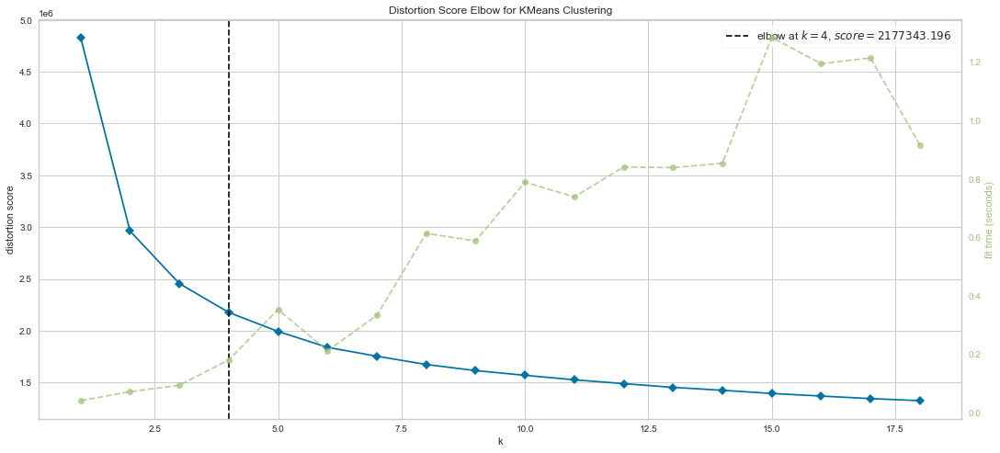

In [13]:
# set the range of values of K to try
k_range = (1, 19)

model = KMeans(random_state=random_state)
visualizer = KElbowVisualizer(model, k=k_range)
visualizer.fit(X)
visualizer.show();

#### Results
We can see that there is an "elbow" starting to form at `K`=4, meaning that this method suggests 4 clusters is the ideal number. It also indicates that the inertia is dropping at this level. 

Also, the algorithm computed the average score for all the clusters. 



### The Silhouette Method

- Not dependent on the notion of cluster centers 
- Calculated using the **mean intra-cluster distance** ($a$) and the **mean nearest-cluster distance** ($b$) for each sample
- the difference between the **the average nearest-cluster distance** ($b$) and **average intra-cluster distance** ($a$) for each sample, normalized by the maximum value

$$\frac{b-a}{max(a,b)}$$

- The best value is 1
- The worst value is -1 (samples have been assigned to wrong clusters)
- Value near 0 means overlapping clusters

The overall **Silhouette score** is the average of the Silhouette scores for all samples.

##### Interpretation

-	The plots show the Silhouette scores for each sample in that cluster
-	Higher scores indicate well separated clusters
-	The size represents the size of samples in each cluster
-	The thickness of each silhouette indicates the cluster size
-	The shape of each silhouette indicates the "goodness" for points in each cluster


#### You can learn more about the Silhouette Visualizer method [here](https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html)

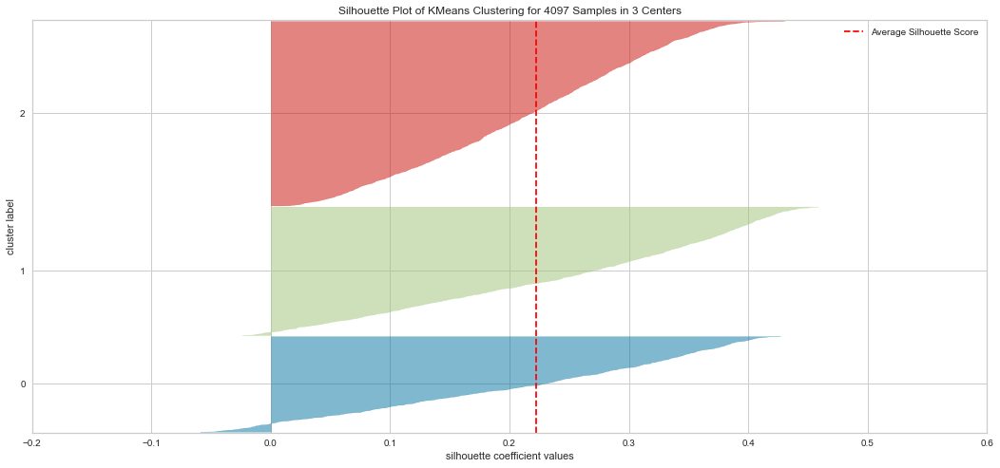

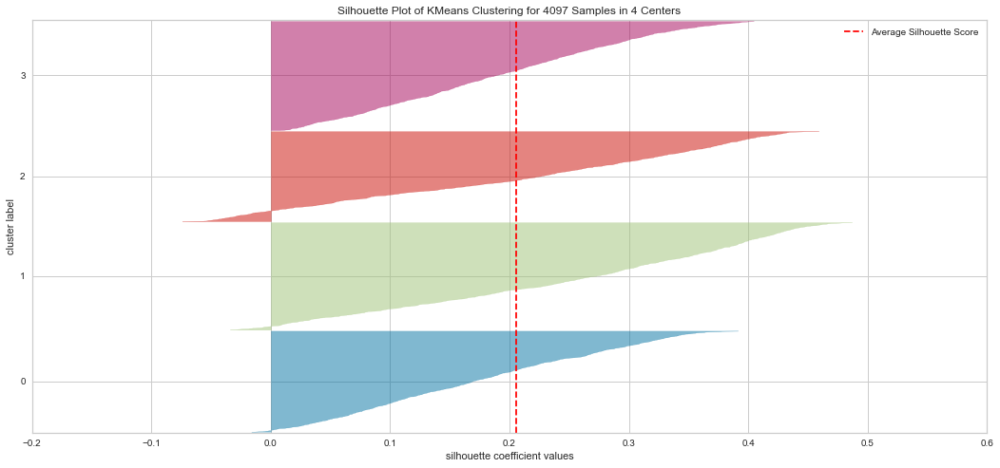

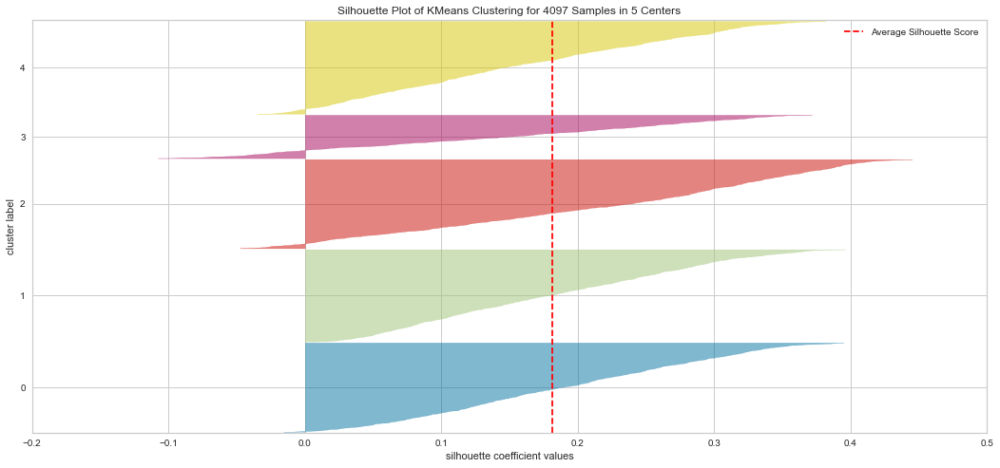

In [14]:
# set k options to try
k_options = [3, 4, 5]

# store models for later use
models = dict()

for i in k_options:
    model = KMeans(i, random_state=random_state)
    visualizer = SilhouetteVisualizer(model, colors="yellowbrick")
    visualizer.fit(X)
    visualizer.show();
    models[i] = model # store the current model

#### Results

From the explained metrics above, we can say that k=3 is the optimal K value given the clusters shape size and the average Silhouette score. It is hard to interpret the plot in these methods. For instatnce the Elbow method indicated K=4 as an optimal while the Silhouette indicated K=3 is optimal in our opinion. 

### Principal Component Analysis (PCA)

In unsupervised learning techniques such as clustering are based on the notion of distances between points. With increased dimensions, the representation of data becomes more complex.

Dimensionality reduction is the task of reducing a dataset in high dimension (our df has many rows) to low dimension while retaining the most "important" characteristics of the data.

#### You can learn more about PCA [here](https://scikit-learn.org/stable/modules/decomposition.html#pca)

PCA for K=3


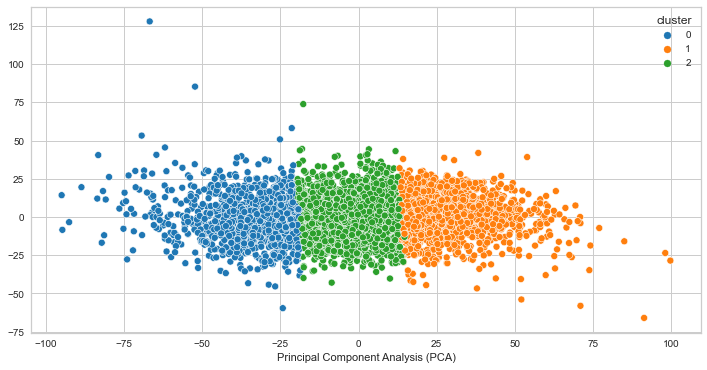

PCA for K=4


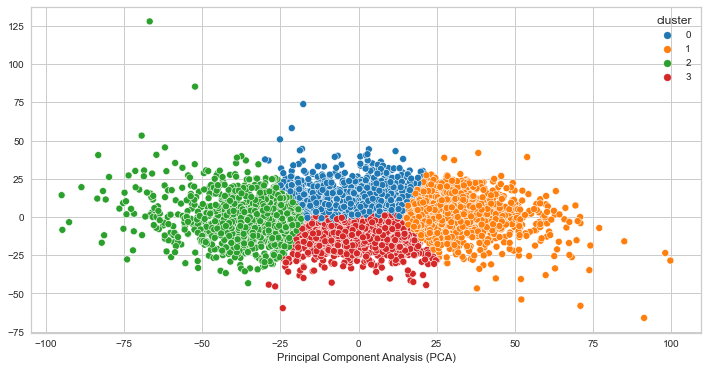

PCA for K=5


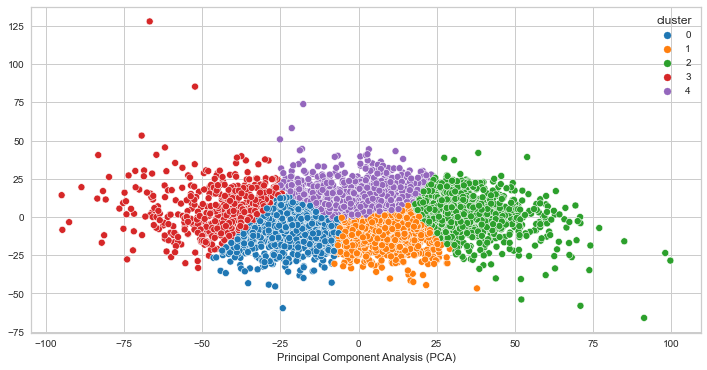

In [15]:
def plot_pca_clusters(data, labels):
    """
    Carries out dimensionality reduction on the data for visualization
    """
    pca = PCA(n_components=2)
    principal_comp = pca.fit_transform(data)
    pca_df = pd.DataFrame(
        data=principal_comp, columns=["Principal Component Analysis (PCA)", ""], index=data.index
    )
    pca_df["cluster"] = labels
    plt.figure(figsize=(12, 6))
    ax = sns.scatterplot(
        x="Principal Component Analysis (PCA)", y="", hue="cluster", data=pca_df, palette="tab10"
    )
    plt.show()

for i, model in models.items():
    print(f"PCA for K={i}")
    plot_pca_clusters(df, model.labels_)

### Results
We can see that the clusters are not very well separated. This indicates that the clusters are not likely quite distinct, however it does not guarantee that the clusters does not represent something useful. In our case, it seems as though the clustering algorithm is picking up on high and low voltage values for creating the clusters. It makes sense that the clusters would look distinct as a result, but the finding is not significant for our goal of identifying brain states given that the voltage values are close to each other. 

## Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
- DBSCAN is a density-based clustering algorithm
- Intuitively, it's based on the idea that clusters form dense regions in the data and so it works by identifying "crowded" regions in the feature space

In [16]:
# Plot functions

def plot_X_dbscan(X, model):
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    colours = []
    if np.any(model.labels_ == -1):
        n_clusters = len(set(model.labels_)) - 1 
    else: 
        n_clusters = len(set(model.labels_))
    
    for i in range(n_clusters + 1):
        colours.append("#%06X" % np.random.randint(0, 0xFFFFFF))
        
    mglearn.discrete_scatter(X[:, 0], X[:, 1], ax=axes[0], markeredgewidth=1.0)

    if np.any(model.labels_ == -1):
        colours = ["w"] + colours
    mglearn.discrete_scatter(X[:, 0], X[:, 1], model.labels_, c=colours, markers="o", markeredgewidth=1.0, ax=axes[1]);
    plt.legend()
    
    
def plot_dbscan_with_labels(X, eps=1.0, min_samples = 2, font_size=14):
    model = DBSCAN(eps=eps, min_samples=min_samples) 
    model.fit(X)    
    if np.any(model.labels_ == -1):
        n_clusters = len(set(model.labels_)) - 1 
    else: 
        n_clusters = len(set(model.labels_))
    plt.title('Number of clusters: %d'%(n_clusters))
    colours = []
    for i in range(n_clusters + 1):
        colours.append("#%06X" % np.random.randint(0, 0xFFFFFF))
        
    #colours = [mglearn.cm3(1), mglearn.cm3(0)]
    if np.any(model.labels_ == -1):
        colours = ["w"] + colours
    mglearn.discrete_scatter(
        X[:, 0], X[:, 1], model.labels_, c=colours, markers="o", markeredgewidth=1.0
    );
    plt.legend()
    labels = [str(label) for label in list(range(0,len(X)))]
    for i, txt in enumerate(labels):
        plt.annotate(txt, X[i], xytext=X[i] + 0.2, size = font_size)


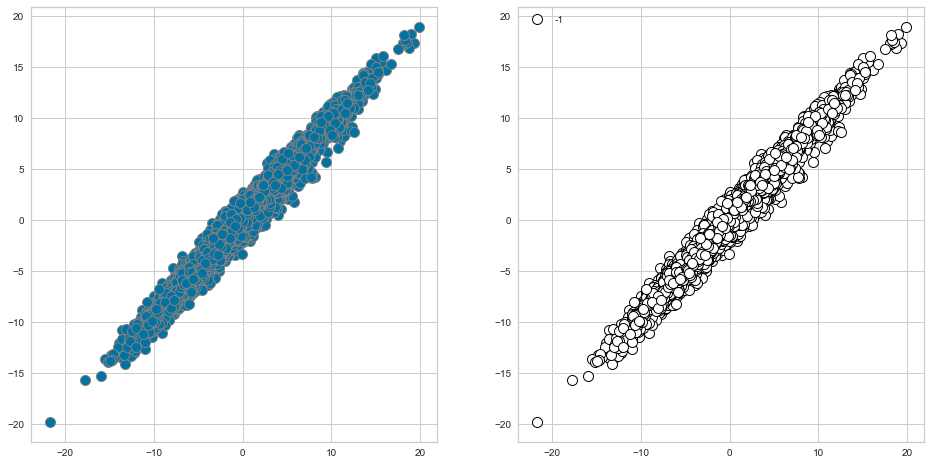

In [17]:
# Uncomment to view interactive version (not compatible with jupyter book)
# from ipywidgets import interactive
# interactive(lambda eps=1: plot_X_dbscan(X, dbscan), eps=(1, 50))

# eps: determines what it means for points to be "close"
# min_samples: determines the number of neighboring points we require to consider in order for a point to be part of a cluster

dbscan = DBSCAN(eps=1.5, min_samples=2)
dbscan.fit(X)
plot_X_dbscan(X, dbscan)

- Increasing `eps` ($\uparrow$) (left to right in the plot above) means more points will be included in a cluster.  
- Increasing `min_samples` ($\uparrow$) (top to bottom in the plot above) means points in less dense regions will either be labeled as their own cluster or noise. 
- In general, it's not trivial to tune these hyperparameters. 

There are three kinds of points:

- Core points are the points that have at least min_samples points in the neighborhood.

- Border points are the points with fewer than min_samples points in the neighborhood, but are connected to a core point.

- Noise points are the points which do not belong to any cluster. In other words, the points which have less that min_samples point within distance eps of the starting point are noise points.

Here we can see that DBSCAN has identified one cluster only; hence, the crowded region. It also identified all the points as noise! (If you try and change 'min_saples=2' to 'min_samples=1' you'll notice that each data point is in cluster). This is expected given the high dimensionality of our data. Although, DBSCAN did not identify any clusters, it's a very useful tool to use especially if you don't want to specify number of clusters (k). 

#### Let's evaluate different hyperparameters 

In [18]:
dbscan = DBSCAN(eps=1.5, min_samples=2)
clusters = dbscan.fit_predict(X)

print("Cluster assignments:{}".format(clusters))

Cluster assignments:[-1 -1 -1 ... -1 -1 -1]


- noise points: shown in white
- core points: bigger
- border points: smaller

min_samples: 2 eps: 1.000000  cluster: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 2 eps: 1.500000  cluster: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 2 eps: 2.000000  cluster: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 2 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 3 eps: 1.000000  cluster: [-1  0  0 -1  0 -1  1  1  0  1 -1 -1]
min_samples: 3 eps: 1.500000  cluster: [0 1 1 1 1 0 2 2 1 2 2 0]
min_samples: 3 eps: 2.000000  cluster: [0 1 1 1 1 0 0 0 1 0 0 0]
min_samples: 3 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]
min_samples: 5 eps: 1.000000  cluster: [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
min_samples: 5 eps: 1.500000  cluster: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 2.000000  cluster: [-1  0  0  0  0 -1 -1 -1  0 -1 -1 -1]
min_samples: 5 eps: 3.000000  cluster: [0 0 0 0 0 0 0 0 0 0 0 0]


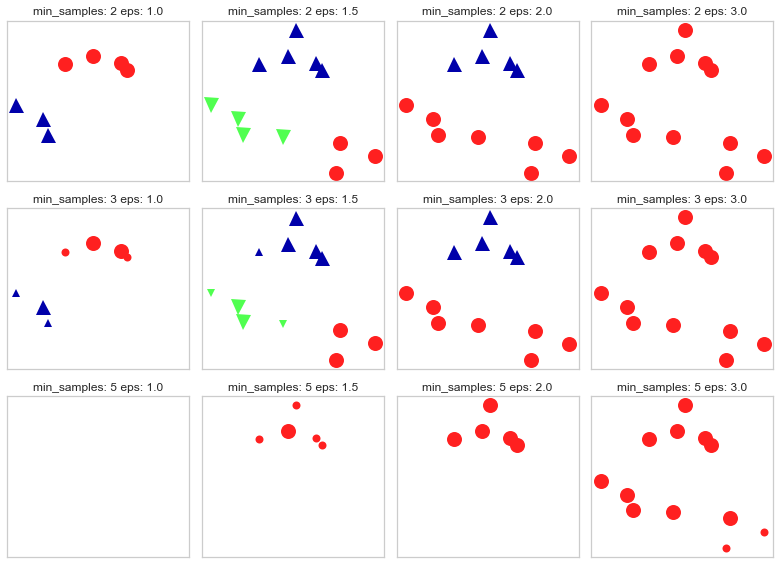

In [19]:
mglearn.plots.plot_dbscan()

##### Here we can see after fitting X, that having min_samples = 2 and eps=1.5 will give us better clustering as there won't be any noises to be clustered.  

### K-Means vs. DBSCAN

- In DBSCAN, you do not have to specify the number of clusters! 
    - Instead, you have to tune `eps` and `min_samples`. 
- Unlike K-Means, DBSCAN doesn't have to assign all points to clusters. 
    - The label is -1 if a point is unassigned.
- Unlike K-Means, there is no `predict` method. 
    - DBSCAN only really clusters the points you have, not "new" or "test" points.

## Exploritory Data Analysis (EDA)


### Cluster Analysis and Interpretation

In [20]:
# View number of values in each cluster

df_predict["Cluster"].value_counts()

3    1097
1    1080
0    1015
2     905
Name: Cluster, dtype: int64

In [21]:
# View general statistics for each cluster

for i in range(len(df_predict["Cluster"].unique())):
    cluster_df = df_predict[df_predict["Cluster"] == i]
    print(f"\nCluster {i}")
    print(cluster_df.iloc[:, :5].describe()) # only view first 5 channels
    # print(cluster_df.describe()) # uncomment to view all channels


Cluster 0
               Fp1          Fp2           F7           T3           T5
count  1015.000000  1015.000000  1015.000000  1015.000000  1015.000000
mean     -1.079065    -1.543156    -2.126689    -0.573390     1.576478
std       3.045540     2.935361     5.040793     2.057074     5.586075
min      -8.948308   -10.324219   -20.007503    -6.975248   -18.812431
25%      -3.402775    -3.615115    -5.166164    -1.970972    -2.103659
50%      -1.106831    -1.570219    -1.931113    -0.553337     1.739261
75%       1.124151     0.587177     1.104513     0.864351     5.173174
max       7.982933     7.247333    16.982293     5.995421    18.409599

Cluster 1
               Fp1          Fp2           F7           T3           T5
count  1080.000000  1080.000000  1080.000000  1080.000000  1080.000000
mean     -6.735572    -6.164777    -3.431292    -3.406613    -5.083461
std       3.055871     3.085328     4.509941     2.102381     5.804971
min     -21.746311   -19.806521   -23.241466   -10.9268

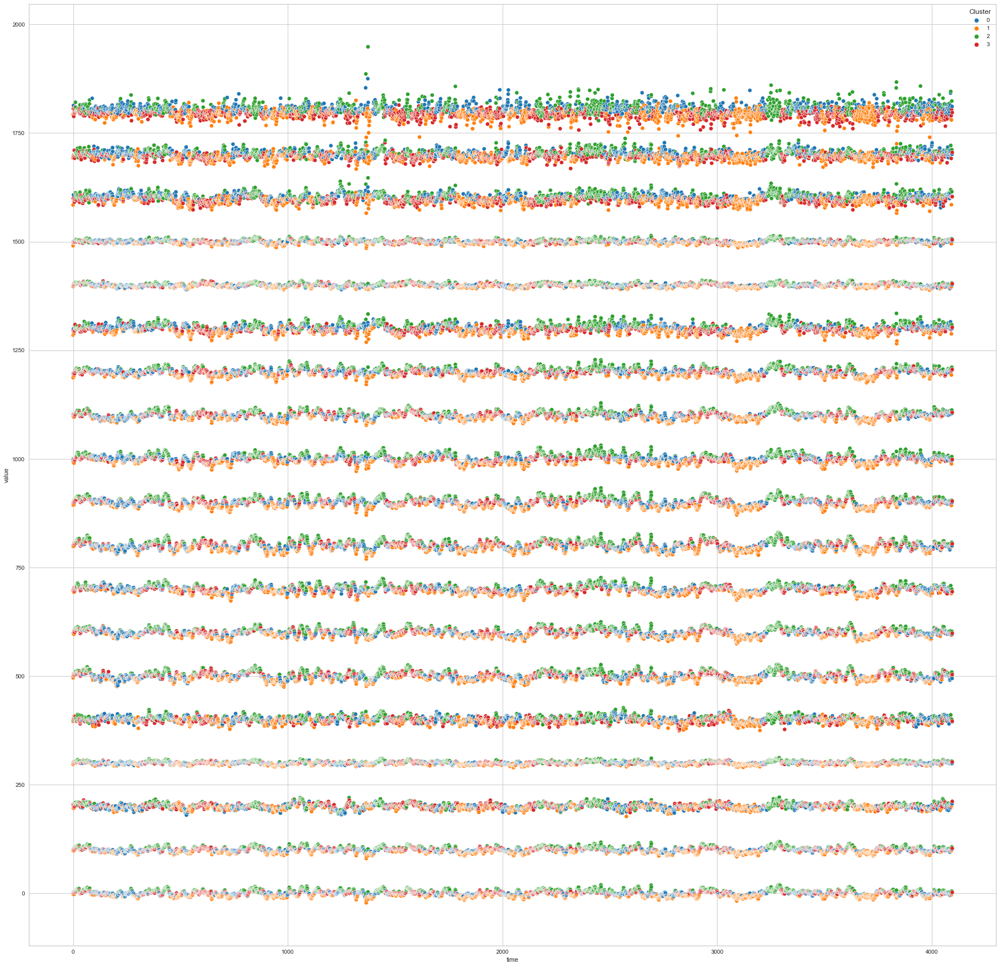

In [22]:
# View all channels at once

plt.figure(figsize=(30, 30))

single_plot_df = df_predict.copy()
for i, col in enumerate(single_plot_df.columns):
    if col != "Cluster":
        single_plot_df[col] = single_plot_df[col] + 100*i
single_plot_df["time"] = single_plot_df.index
single_plot_df = single_plot_df.melt(id_vars=["Cluster", "time"])
ax = sns.scatterplot(
    x="time", y="value", hue="Cluster", data=single_plot_df, palette="tab10"
)
plt.show()

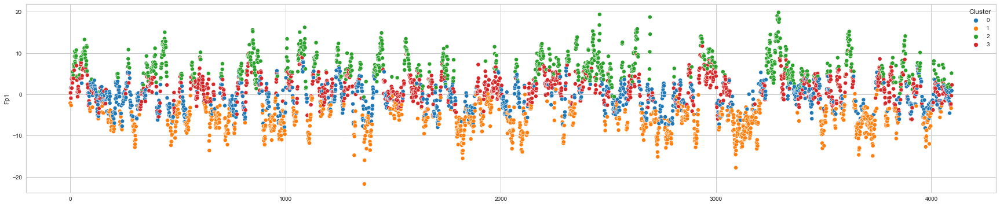

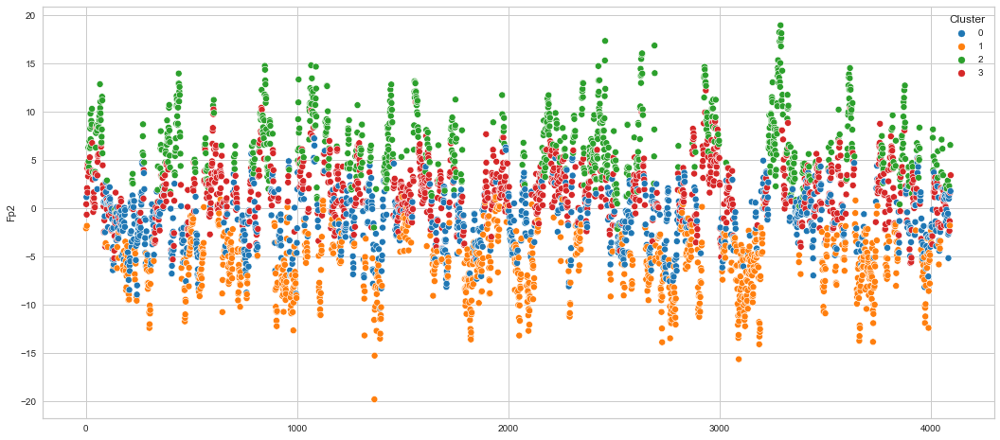

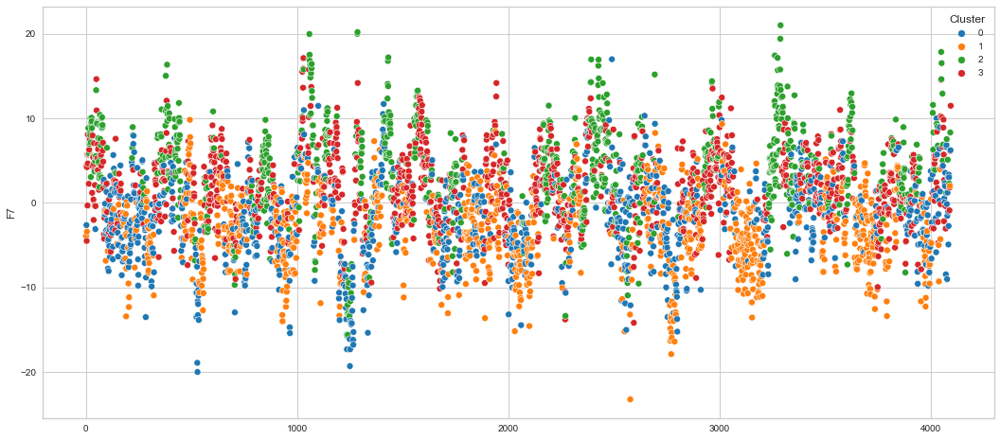

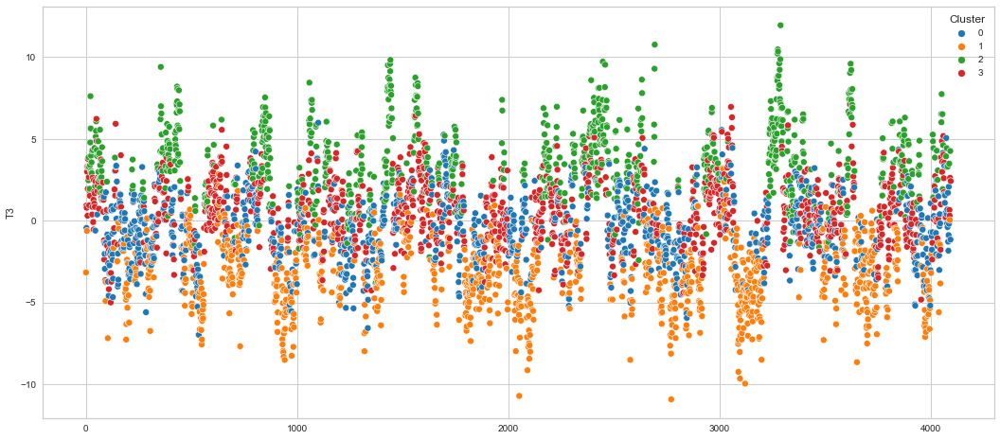

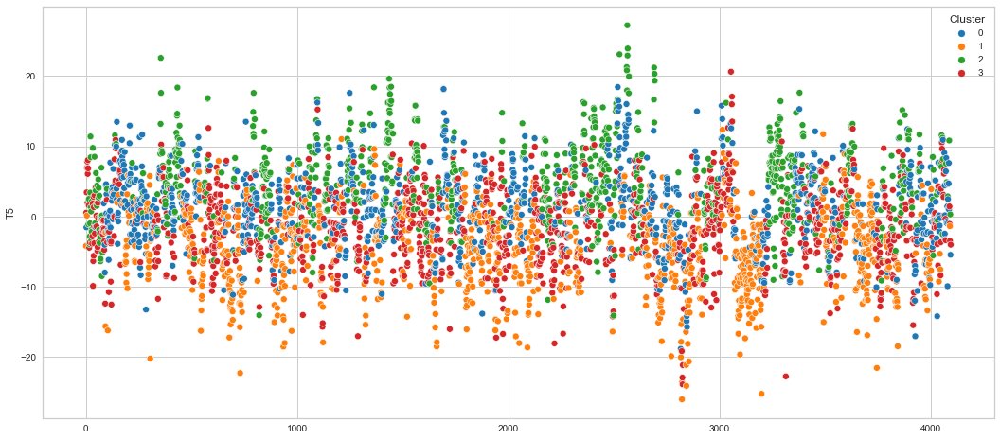

...

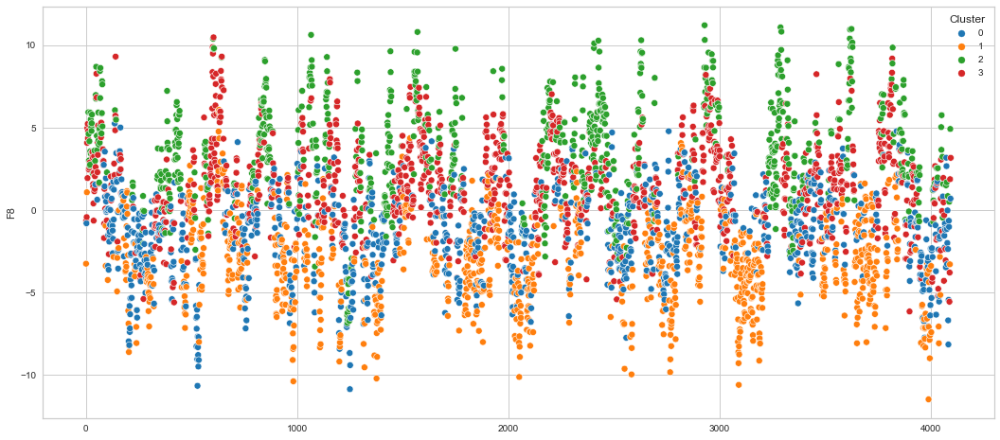

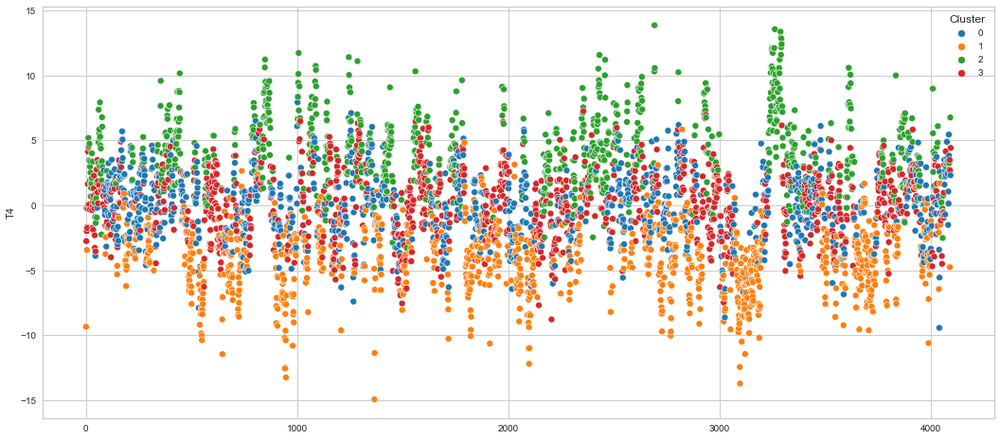

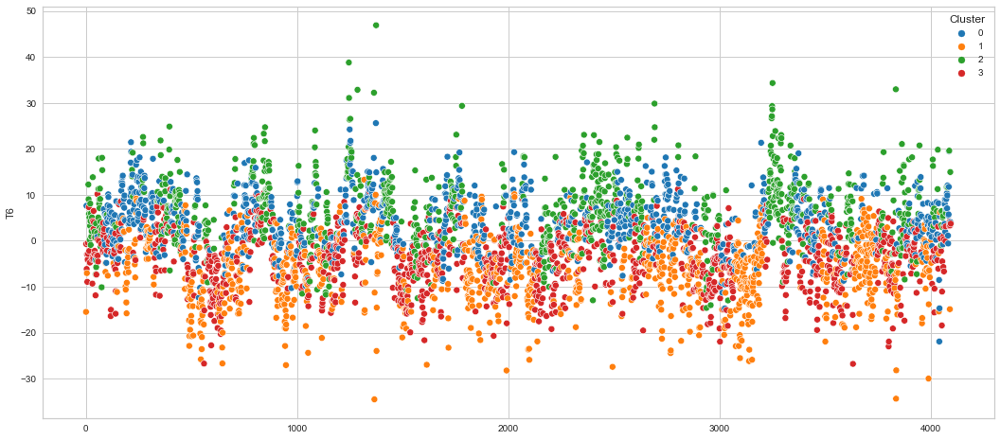

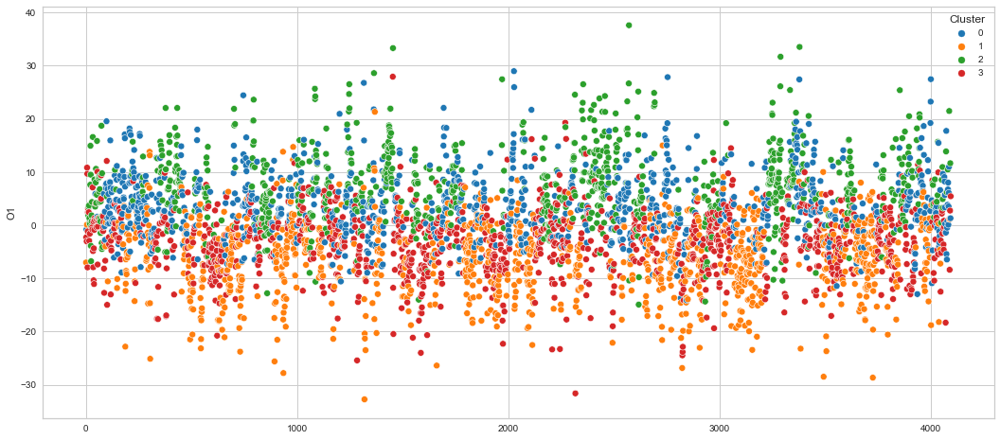

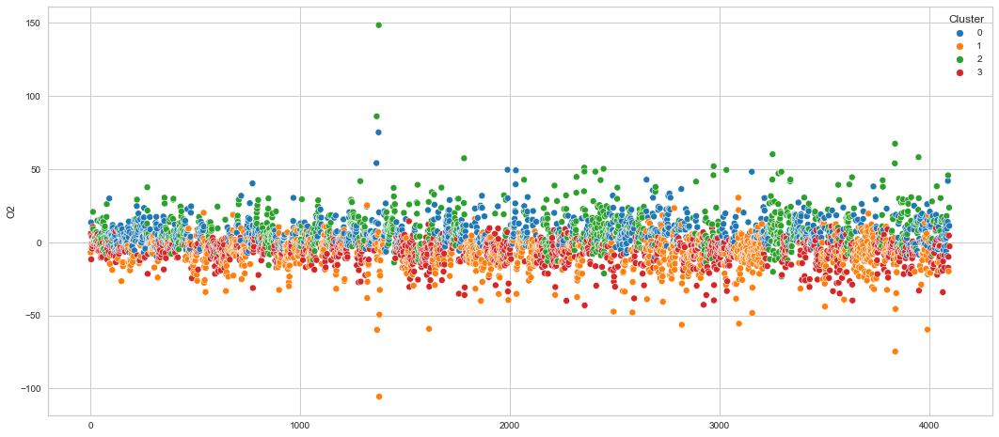

In [23]:
# View channels in individual plots

plt.figure(figsize=(30, 6))

for col in df_predict.columns:
    if col != "Cluster":
        ax = sns.scatterplot(
            x=df_predict.index, y=col, hue="Cluster", data=df_predict, palette="tab10"
        )
        plt.show()

#### Results

We can clearly see that the K-means algorithm clustered the low/negative values in orange and the high/positive values in green. As for the middle cluster groups (green & blue), we need to investigate further in order to come up with relationship and clear pattern. 

## Correlation between the channels 

In order to understand the correlation between the channels, we need to use statistics test that looks at the relationship between two continues variables and measure the linear correlation between them. A good test that fits here is The Pearson's Correlation Coefficient. It's a linear correlation coefficient that gives values between -1 and 1 where 1 indicates a strong positive correlation and -1 indicates a strong negative correlation. However, for this dataset we will use the Spearman's Rank-Order Correlation method, which is the nonparametric version of the Pearon's method. You may read more about the Spearman's method and reasoning behind using it [here](https://statistics.laerd.com/statistical-guides/spearmans-rank-order-correlation-statistical-guide.php#:~:text=The%20Spearman%27s%20rank%2Dorder%20correlation%20is%20the%20nonparametric%20version%20of,association%20between%20two%20ranked%20variables.).

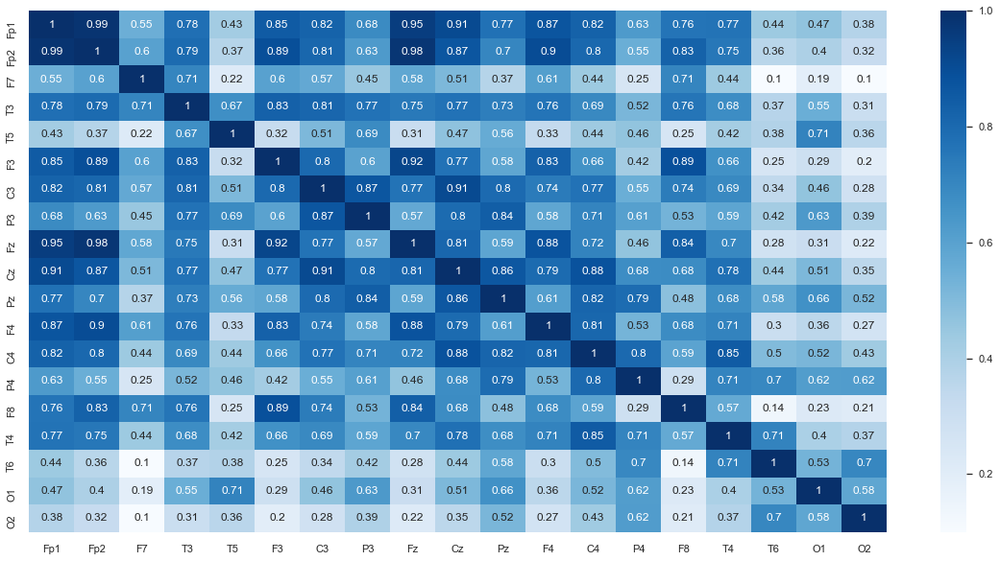

In [24]:
# Generate the heat correlation heatmap
plt.rcParams['figure.figsize'] = [20, 10]
sns.set(font_scale=1)
df_spearman = df.corr('spearman')
sns.heatmap(df_spearman, annot=True, cmap=plt.cm.Blues);

#### Using the Elbow method to determine the number of clusters for the spearman dataframe

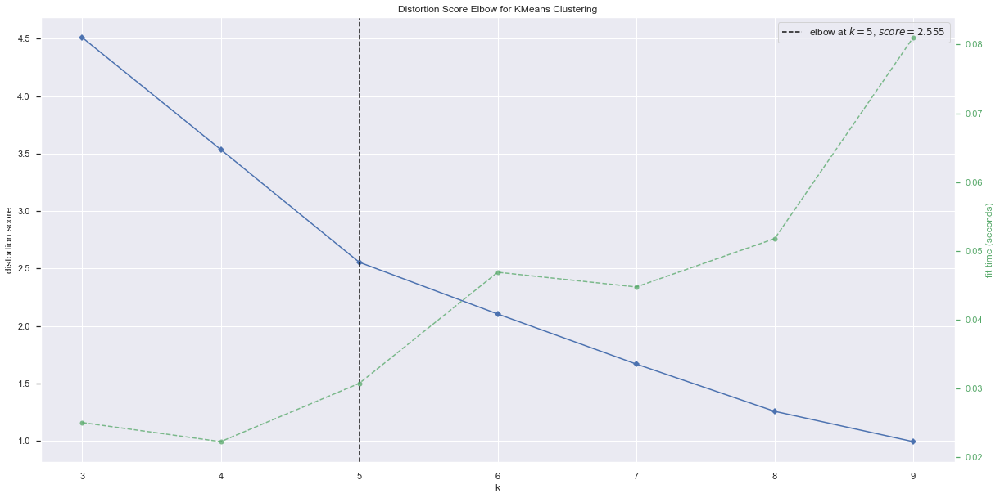

In [25]:
k_range = (3, 10)

model = KMeans(random_state=random_state)
visualizer = KElbowVisualizer(model, k=k_range)
visualizer.fit(df_spearman)
visualizer.show();

In [26]:
# fit k=5 
kmeans_model = KMeans(n_clusters=5, random_state=random_state)
kmeans_model.fit(df_spearman)

KMeans(n_clusters=5, random_state=42)

In [27]:
predictions2 = kmeans_model.predict(df_spearman)
predictions2

array([0, 0, 3, 0, 2, 0, 0, 4, 0, 0, 4, 0, 4, 4, 3, 4, 1, 2, 1],
      dtype=int32)

In [28]:
# add Clusters column
df_spearman['Clusters'] = predictions2
df_spearman

,Fp1,Fp2,F7,T3,T5,F3,C3,P3,Fz,Cz,Pz,F4,C4,P4,F8,T4,T6,O1,O2,Clusters
Fp1,1.000000,0.985205,0.546587,0.780768,0.426610,0.851884,0.822344,0.684495,0.952306,0.911366,0.774388,0.870544,0.824644,0.628842,0.762576,0.767660,0.437945,0.466884,0.375774,0
Fp2,0.985205,1.000000,0.601739,0.793645,0.373769,0.893247,0.806807,0.628777,0.975541,0.869301,0.701349,0.903649,0.803317,0.550765,0.826845,0.751332,0.362769,0.397810,0.324800,0
F7,0.546587,0.601739,1.000000,0.706390,0.217126,0.601594,0.571655,0.448109,0.579056,0.508471,0.372821,0.613025,0.439562,0.253015,0.708019,0.439112,0.100639,0.188957,0.099914,3
T3,0.780768,0.793645,0.706390,1.000000,0.672380,0.829486,0.812087,0.769368,0.747212,0.770784,0.732658,0.763861,0.691557,0.515150,0.759423,0.678946,0.369955,0.552330,0.306100,0
T5,0.426610,0.373769,0.217126,0.672380,1.000000,0.319102,0.508949,0.686085,0.311007,0.471060,0.561803,0.329767,0.436401,0.463156,0.252440,0.416934,0.381740,0.713107,0.357365,2
F3,0.851884,0.893247,0.601594,0.829486,0.319102,1.000000,0.802665,0.597191,0.923915,0.770035,0.582412,0.829804,0.659554,0.420305,0.889385,0.663668,0.252281,0.290107,0.197882,0
C3,0.822344,0.806807,0.571655,0.812087,0.508949,0.802665,1.000000,0.869411,0.767681,0.909235,0.796664,0.740344,0.771288,0.551943,0.738384,0.691596,0.342382,0.464527,0.282680,0
P3,0.684495,0.628777,0.448109,0.769368,0.686085,0.597191,0.869411,1.000000,0.573018,0.795533,0.841303,0.584268,0.708258,0.607484,0.531562,0.586200,0.420715,0.632875,0.389191,4
Fz,0.952306,0.975541,0.579056,0.747212,0.311007,0.923915,0.767681,0.573018,1.000000,0.813120,0.588303,0.879628,0.715187,0.463206,0.835121,0.695167,0.275775,0.309499,0.217240,0
Cz,0.911366,0.869301,0.508471,0.770784,0.471060,0.770035,0.909235,0.795533,0.813120,1.000000,0.863732,0.794082,0.882902,0.677186,0.681544,0.777276,0.439926,0.508343,0.353834,0


In [29]:
# Sort the df based on cluster values and drop the Clusters column
df_sort2 = df_spearman.sort_values('Clusters')
df_sort3 = df_sort2[list(df_sort2.index)]
df_sort3

,Fp1,F4,Fz,C3,F3,Cz,T3,Fp2,T6,O2,O1,T5,F7,F8,P3,Pz,C4,P4,T4
Fp1,1.000000,0.870544,0.952306,0.822344,0.851884,0.911366,0.780768,0.985205,0.437945,0.375774,0.466884,0.426610,0.546587,0.762576,0.684495,0.774388,0.824644,0.628842,0.767660
F4,0.870544,1.000000,0.879628,0.740344,0.829804,0.794082,0.763861,0.903649,0.304168,0.268834,0.355441,0.329767,0.613025,0.683393,0.584268,0.613822,0.807354,0.528270,0.714352
Fz,0.952306,0.879628,1.000000,0.767681,0.923915,0.813120,0.747212,0.975541,0.275775,0.217240,0.309499,0.311007,0.579056,0.835121,0.573018,0.588303,0.715187,0.463206,0.695167
C3,0.822344,0.740344,0.767681,1.000000,0.802665,0.909235,0.812087,0.806807,0.342382,0.282680,0.464527,0.508949,0.571655,0.738384,0.869411,0.796664,0.771288,0.551943,0.691596
F3,0.851884,0.829804,0.923915,0.802665,1.000000,0.770035,0.829486,0.893247,0.252281,0.197882,0.290107,0.319102,0.601594,0.889385,0.597191,0.582412,0.659554,0.420305,0.663668
Cz,0.911366,0.794082,0.813120,0.909235,0.770035,1.000000,0.770784,0.869301,0.439926,0.353834,0.508343,0.471060,0.508471,0.681544,0.795533,0.863732,0.882902,0.677186,0.777276
T3,0.780768,0.763861,0.747212,0.812087,0.829486,0.770784,1.000000,0.793645,0.369955,0.306100,0.552330,0.672380,0.706390,0.759423,0.769368,0.732658,0.691557,0.515150,0.678946
Fp2,0.985205,0.903649,0.975541,0.806807,0.893247,0.869301,0.793645,1.000000,0.362769,0.324800,0.397810,0.373769,0.601739,0.826845,0.628777,0.701349,0.803317,0.550765,0.751332
T6,0.437945,0.304168,0.275775,0.342382,0.252281,0.439926,0.369955,0.362769,1.000000,0.701116,0.530696,0.381740,0.100639,0.136912,0.420715,0.582339,0.498278,0.696381,0.711869
O2,0.375774,0.268834,0.217240,0.282680,0.197882,0.353834,0.306100,0.324800,0.701116,1.000000,0.582958,0.357365,0.099914,0.211800,0.389191,0.516337,0.432602,0.623366,0.374492


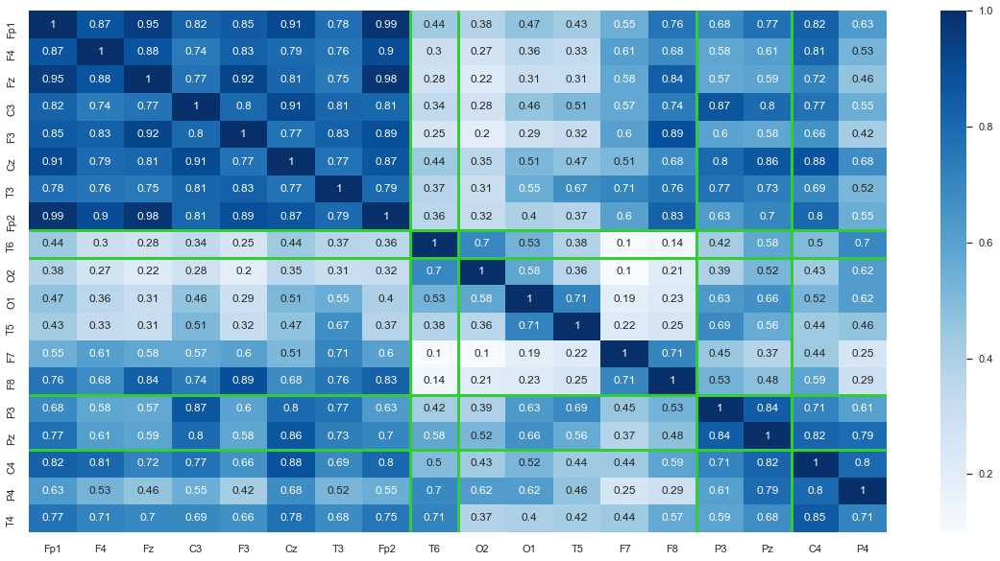

In [30]:
# Plot heatmap for the clustered dataframe
sns.set(font_scale=1)
ax = sns.heatmap(df_sort3.iloc[:,:-1], annot=True, cmap=plt.cm.Blues)
ax.hlines([8, 9, 14,16], color = 'limegreen', *ax.get_xlim(), linewidths=3) # numbers are coordinates for the axis
ax.vlines([8, 9, 14,16], color = 'limegreen', *ax.get_ylim(), linewidths=3) # numbers are coordinates for the axis

#### Results

Notice how Fp2 is noisy and suspicious hence it got clustered by itself. The green lines represent the boundaries between clusters. Also, we can see that nodes that are close to each other tend to be more correlated as seen by the darker blue sections along the diagonal of the heatmap and lighter blue near the outsides. This makes sense intuitively, because when a change in voltage occurs it may be picked up by multiple channels.

We can also run the following code to examine the correlation of Fp2 using our topomap_2d function for further analysis:

```python 

from simpl_eeg import topomap_2d, eeg_objects 
topomap_2d.plot_topomap_2d(
    epoch,
    np.array(df_spearman['Fp2']),
    mark="channel_name",
    cmin=0,
    cmax=1,
    colormap="tab10",
    **{'image_interp':'none'}
);

```

## Attribution

- Most of the material of this notebook came form DSCI_563 using the following license agreement

The following MIT License is applied to the code contained in this repository. The intent is for MDS students to be able to refer back to their course notes and reuse code for future projects. Students: note that the MIT License requires including the copyright/permission notice with the code.

MIT License

Copyright (c) 2021 Varada Kolhatkar, Rodolfo Lourenzutti, Mike Gelbart

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

https://github.ubc.ca/MDS-2020-21/DSCI_563_unsup-learn_students/blob/master/LICENSE.md